# Methods Notebook: Extracting Call Samples for KMeans Clustering

## Imports Section:

In [23]:
import numpy as np
import pandas as pd
import random
import scipy
from scipy import stats
import datetime as dt
import dask.dataframe as dd

In [24]:
import librosa
import warnings

In [25]:
import glob
import matplotlib.pyplot as plt
from matplotlib import colors
import soundfile as sf
import matplotlib.patches as patches
from pathlib import Path

In [26]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm

In [27]:
import sys

# append the path of the
# parent directory
sys.path.append('..')
sys.path.append('../src/')
sys.path.append('../src/models/bat_call_detector/batdetect2/')

import src.batdt2_pipeline as batdetect2_pipeline
import src.file_dealer as file_dealer

## Function Definitions (most important functions are in `src/`)
### Below are the functions used for plotting and visualization

In [28]:
FREQ_COLORS = {'LF':'cyan', 'HF':'orange'}

In [29]:
def convert_nabatdf_to_ravenprodf(df):
    raven_df = pd.DataFrame()
    raven_df['Begin Time (s)'] =  (df['peak_time_ms']-50)/1000
    raven_df['End Time (s)'] = (df['peak_time_ms']-40)/1000
    raven_df['Low Freq (Hz)'] = df['peak_freq_hz']-2000
    raven_df['High Freq (Hz)'] = df['peak_freq_hz']+2000
    raven_df['prediction'] = df['prediction']
    raven_df['score'] = df['score']
    raven_df.sort_values('Begin Time (s)', inplace=True)
    raven_df.insert(0, 'Selection', np.arange(len(raven_df)).astype(int)+1)

    raventxt_df = pd.DataFrame(np.repeat(raven_df.values, 2, axis=0))
    raventxt_df.columns = raven_df.columns
    raventxt_df['Selection'] = raventxt_df['Selection'].astype(int)
    raventxt_df.insert(1, 'Channel', [1]*raventxt_df.shape[0])
    views = np.array(['Waveform 1']*raventxt_df.shape[0], dtype='object')
    views[1::2] = 'Spectrogram 1'
    raventxt_df.insert(1, 'View', views)

    return raventxt_df

def convert_nabatdf_to_bd2df(df):
    bd2_df = pd.DataFrame()
    bd2_df['start_time'] = (df['peak_time_ms']-50)/1000
    bd2_df['end_time'] = (df['peak_time_ms']-40)/1000
    bd2_df['low_freq'] = df['peak_freq_hz']-2000
    bd2_df['high_freq'] = df['peak_freq_hz']+2000
    bd2_df['prediction'] = df['prediction']
    bd2_df['score'] = df['score']
    bd2_df.sort_values('start_time', inplace=True)
    
    return bd2_df

def convert_kaleidoscopedf_to_ravenprodf(df):
    raven_df = pd.DataFrame()
    raven_df['Begin Time (s)'] = df['OFFSET']
    raven_df['End Time (s)'] = df['OFFSET'] + df['DURATION']
    raven_df['Low Freq (Hz)'] = df['Fmin']
    raven_df['High Freq (Hz)'] = df['Fmax']
    raven_df['input_file'] = df['IN FILE']
    raven_df['input_dir'] = df['INDIR']
    raven_df['mean_freq'] = df['Fmean']
    if 'TOP1MATCH*' in df.columns:
        raven_df['TOP1MATCH*'] = df['TOP1MATCH*']
    if 'TOP1MATCH' in df.columns:
        raven_df['TOP1MATCH'] = df['TOP1MATCH']
    raven_df['TOP1DIST'] = df['TOP1DIST']
    raven_df['TOP2MATCH'] = df['TOP2MATCH']
    raven_df['TOP2DIST'] = df['TOP2DIST']
    raven_df['TOP3MATCH'] = df['TOP3MATCH']
    raven_df['TOP3DIST'] = df['TOP3DIST']
    raven_df.sort_values('Begin Time (s)', inplace=True)
    raven_df.insert(0, 'Selection', np.arange(len(raven_df)).astype(int)+1)

    raventxt_df = pd.DataFrame(np.repeat(raven_df.values, 2, axis=0))
    raventxt_df.columns = raven_df.columns
    raventxt_df['Selection'] = raventxt_df['Selection'].astype(int)
    raventxt_df.insert(1, 'Channel', [1]*raventxt_df.shape[0])
    views = np.array(['Waveform 1']*raventxt_df.shape[0], dtype='object')
    views[1::2] = 'Spectrogram 1'
    raventxt_df.insert(1, 'View', views)

    return raventxt_df

def convert_kaleidoscopedf_to_bd2df(df):
    bd2_df = pd.DataFrame()
    bd2_df['start_time'] = df['OFFSET']
    bd2_df['end_time'] = df['OFFSET'] + df['DURATION']
    bd2_df['low_freq'] = df['Fmin']
    bd2_df['high_freq'] = df['Fmax']
    bd2_df['input_file'] = df['IN FILE']
    bd2_df['input_dir'] = df['INDIR']
    bd2_df['mean_freq'] = df['Fmean']
    if 'TOP1MATCH*' in df.columns:
        bd2_df['TOP1MATCH*'] = df['TOP1MATCH*']
    if 'TOP1MATCH' in df.columns:
        bd2_df['TOP1MATCH'] = df['TOP1MATCH']
    bd2_df['TOP1DIST'] = df['TOP1DIST']
    bd2_df['TOP2MATCH'] = df['TOP2MATCH']
    bd2_df['TOP2DIST'] = df['TOP2DIST']
    bd2_df['TOP3MATCH'] = df['TOP3MATCH']
    bd2_df['TOP3DIST'] = df['TOP3DIST']
    bd2_df.sort_values('start_time', inplace=True)
    
    return bd2_df

def convert_raventxtdf_to_bd2df(raventxt_df):
    bd2_human_df = raventxt_df[1::2].copy()
    bd2_human_df = bd2_human_df.drop(columns=['Selection', 'View', 'Channel'])
    bd2_human_df.rename(columns={'Begin Time (s)':'start_time',
                                'End Time (s)':'end_time',
                                'Low Freq (Hz)':'low_freq',
                                'High Freq (Hz)':'high_freq',
                                'Manually-Verified Phonic Group':'freq_group',
                                'SNR NIST Quick (dB)':'snr_nist_quick_dB',
                                'Delta Time (s)':'delta_time_s'}, inplace=True)
    bd2_human_df.sort_values('start_time', inplace=True)
    
    return bd2_human_df

def convert_bd2df_ravenpro(df: pd.DataFrame):
    """
    Converts a dataframe to the format used by RavenPro
    """

    ravenpro_df = df.copy()

    ravenpro_df.rename(columns={
        "start_time": "Begin Time (s)",
        "end_time": "End Time (s)",
        "low_freq": "Low Freq (Hz)",
        "high_freq": "High Freq (Hz)",
        "event": "Annotation",
        "freq_group":"Manually-Verified Phonic Group",
        'snr_nist_quick_dB':'SNR NIST Quick (dB)',
        'delta_time_s':'Delta Time (s)'
    }, inplace=True)

    ravenpro_df["Selection"] = np.arange(0, df.shape[0]).astype('int') + 1
    ravenpro_df["View"] = "Waveform 1"
    ravenpro_df["Channel"] = "1"

    return ravenpro_df

In [30]:
file_sites = {'20220730_053000':'Carp',
 '20220826_070000':'Central',
 '20220727_083000':'Foliage',
 '20220829_090000':'Foliage'}

extension = ".txt"
sep = "\t"
raventxt_human_files_dir = f'{Path.home()}/Documents/Research/mila_files/mila-human-wav-txt'
bd2_dets_save_dir = Path(f'20250127__group_threshold_sweep_results')
TP_CLASSIFICATION_THRESHOLD = 0.012

SITE_NAMES = {'Carp':'Carp Pond', 'Foliage':'Foliage', 'Central':'Central Pond'}

file_keys = list(file_sites.keys())
file_keys

['20220730_053000', '20220826_070000', '20220727_083000', '20220829_090000']

In [31]:
wav_filename = '20220826_070000'
site = file_sites[wav_filename]
plot_file = Path(f'{raventxt_human_files_dir}/{wav_filename}.WAV')
raventxt_human_filename = f'{wav_filename}_manually_verified_by_AK_with_groups'

In [32]:
snr_included_ravenpro_human_txt = pd.read_csv(f'{raventxt_human_files_dir}/{raventxt_human_filename}_ravenpro_SNR_aditya_SNR_and_peakfreqtime.txt', sep=sep)
bd2_human_df_file = snr_included_ravenpro_human_txt.copy()
bd2_human_df_file = bd2_human_df_file.drop(columns=['Selection', 'View', 'Channel'])
bd2_human_df_file.rename(columns={'Begin Time (s)':'start_time',
                            'End Time (s)':'end_time',
                            'Low Freq (Hz)':'low_freq',
                            'High Freq (Hz)':'high_freq',
                            'Delta Time (s)':'delta_time_s',
                            'Manually-Verified Phonic Group':'freq_group',
                            'SNR NIST Quick (dB)':'snr_nist_quick_dB'}, inplace=True)
bd2_human_df_file.sort_values('start_time', inplace=True)
bd2_human_df_file

,start_time,end_time,low_freq,high_freq,delta_time_s,snr_nist_quick_dB,Annotation,detection_confidence,input_file,freq_group,adityas_method_snr_dB,peak_frequency_time
0,1.729564,1.737108,44070.175,51087.719,0.0075,13.66,AK_echolocation,NaN,NaN,HF,2.567162,1.733019
1,3.770500,3.777100,45234.000,54096.000,0.0066,13.72,Echolocation,0.512,20220826_070000.WAV,HF,6.879404,3.773733
2,3.911402,3.918947,43903.720,56927.790,0.0075,15.01,AK_echolocation,NaN,NaN,HF,7.902035,3.914858
3,4.043419,4.050209,44281.690,58478.873,0.0068,11.30,AK_echolocation,NaN,NaN,HF,1.782390,4.046462
4,4.161126,4.170934,43903.720,56507.659,0.0098,11.50,AK_echolocation,NaN,NaN,HF,1.514990,4.166985
...,...,...,...,...,...,...,...,...,...,...,...,...
4401,1787.774500,1787.784900,37500.000,46675.000,0.0104,17.90,Echolocation,0.587,20220826_070000.WAV,HF,9.656562,1787.779767
4402,1787.959500,1787.969400,37500.000,45913.000,0.0099,13.38,Echolocation,0.591,20220826_070000.WAV,HF,6.562988,1787.964100
4403,1788.212500,1788.221200,39218.000,48186.000,0.0087,13.74,Echolocation,0.544,20220826_070000.WAV,HF,8.990165,1788.217133
4404,1788.413500,1788.422500,40078.000,49982.000,0.0090,14.19,Echolocation,0.566,20220826_070000.WAV,HF,5.589297,1788.419000


In [33]:
args = dict()
args['chunk_size'] = 2
args['detection_threshold'] = 0.00
ones = int(args['detection_threshold'])
decimals = int(int(100*(args['detection_threshold'])) % 100)
threshold_tag = f"threshold{ones}p{decimals:02}"
save_loc_reduced_overlaps = Path(f"bd2__{threshold_tag}_chunksize{int(args['chunk_size'])}_{wav_filename}_REDUCED_OVERLAPS.csv")
filepath_reduced_overlaps = bd2_dets_save_dir / save_loc_reduced_overlaps
bd2_file_all_dets = pd.read_csv(filepath_reduced_overlaps, sep=',', index_col=0)
bd2_file_all_dets.rename(columns={'KMEANS_CLASSES':'freq_group'}, inplace=True)
bd2_file_all_dets

,freq_group,peak_frequency_time_SPECTROGRAM,peak_frequency_SPECTROGRAM,peak_frequency_WELCH,SNR,start_time,end_time,low_freq,high_freq,class,class_prob,det_prob,individual,event,sampling_rate,input_file
2,HF,0.001833,50250.0,48960.0,1.866691,0.0015,0.0099,47812,51961,Pipistrellus pipistrellus,0.029,0.035,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
3,LF,0.081633,21750.0,22080.0,4.325132,0.0685,0.0827,22890,27157,Nyctalus leisleri,0.015,0.026,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
5,HF,0.103000,78000.0,72960.0,0.030461,0.0805,0.1215,68437,83068,Rhinolophus ferrumequinum,0.027,0.027,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
6,LF,0.126333,27750.0,24960.0,0.067604,0.1225,0.1320,25468,33966,Eptesicus serotinus,0.010,0.026,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
7,HF,0.250467,74250.0,72000.0,0.301496,0.2355,0.2747,68437,81583,Rhinolophus ferrumequinum,0.025,0.025,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91444,LF,1794.795100,21000.0,20160.0,1.870791,1794.7905,1794.8039,18593,23668,Nyctalus noctula,0.019,0.044,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
91445,LF,1794.872400,28500.0,24000.0,0.519903,1794.8715,1794.8781,24609,37378,Plecotus austriacus,0.020,0.040,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
91446,LF,1794.920500,12750.0,12480.0,11.896093,1794.9185,1794.9275,12578,19181,Nyctalus leisleri,0.018,0.024,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...
91450,LF,1794.956833,21750.0,22080.0,1.793079,1794.9505,1794.9610,22031,27451,Nyctalus leisleri,0.011,0.031,-1,Echolocation,192000,/Users/adityakrishna/Documents/Research/mila_f...


In [34]:
def return_true_positives_using_human_df(human_df, machine_df):
    dist_matrix = np.zeros((len(machine_df), len(human_df)))
    association_matrix = np.zeros((len(machine_df), len(human_df)), dtype='bool')
    collect_human = pd.DataFrame()
    collect_bd2 = pd.DataFrame()
    for index in range(len(machine_df)):
        batdetect2_row = machine_df.iloc[index]
        dist_to_all_calls = ((human_df['peak_frequency_time'] - batdetect2_row['peak_frequency_time_SPECTROGRAM']).values)
        dist_matrix[index,:] = dist_to_all_calls
    
        dist_to_all_calls[np.abs(dist_to_all_calls)>=TP_CLASSIFICATION_THRESHOLD] = 1
        dist_to_all_calls[np.abs(dist_to_all_calls)<TP_CLASSIFICATION_THRESHOLD] = 0
        if np.abs(dist_to_all_calls-1).sum() > 1:
            collect_human = pd.concat([collect_human, human_df[dist_to_all_calls<0.5]])
            collect_bd2 = pd.concat([collect_bd2, pd.DataFrame(batdetect2_row).T])

        association_matrix[index,:] = ~dist_to_all_calls.astype('bool')

    human_bd2_true_positives = human_df.loc[np.logical_or.reduce(association_matrix, axis=0)]
    machine_false_negatives = human_df.loc[~(np.logical_or.reduce(association_matrix, axis=0))]
    machine_true_positives = machine_df.loc[np.logical_or.reduce(association_matrix, axis=1)]
    machine_false_positives = machine_df.loc[~(np.logical_or.reduce(association_matrix, axis=1))]

    separated_performance_dfs = dict()
    separated_performance_dfs['machine_true_positives'] = machine_true_positives
    separated_performance_dfs['machine_false_positives'] = machine_false_positives
    separated_performance_dfs['machine_false_negatives'] = machine_false_negatives
    separated_performance_dfs['human_true_positives'] = human_bd2_true_positives

    return association_matrix, separated_performance_dfs

In [35]:
bd2_human_df_file_LF = bd2_human_df_file[bd2_human_df_file['freq_group']=='LF'].copy()
lf_bd2_file_all_dets = bd2_file_all_dets[bd2_file_all_dets['freq_group']=='LF'].copy()

bd2_human_df_file_HF = bd2_human_df_file[bd2_human_df_file['freq_group']=='HF'].copy()
hf_bd2_file_all_dets = bd2_file_all_dets[bd2_file_all_dets['freq_group']=='HF'].copy()

lf_association_matrix, lf_separated_performance_dfs = return_true_positives_using_human_df(bd2_human_df_file_LF, lf_bd2_file_all_dets)
hf_association_matrix, hf_separated_performance_dfs = return_true_positives_using_human_df(bd2_human_df_file_HF, hf_bd2_file_all_dets)

In [36]:
lf_human_true_positives = lf_separated_performance_dfs['human_true_positives']
lf_bd2_false_negatives = lf_separated_performance_dfs['machine_false_negatives']
lf_bd2_true_positives = lf_separated_performance_dfs['machine_true_positives']
lf_bd2_false_positives = lf_separated_performance_dfs['machine_false_positives']
print(len(lf_human_true_positives), len(lf_bd2_false_negatives), len(lf_bd2_true_positives), len(lf_bd2_false_positives))

1086 52 1098 28685


In [37]:
hf_human_true_positives = hf_separated_performance_dfs['human_true_positives']
hf_bd2_false_negatives = hf_separated_performance_dfs['machine_false_negatives']
hf_bd2_true_positives = hf_separated_performance_dfs['machine_true_positives']
hf_bd2_false_positives = hf_separated_performance_dfs['machine_false_positives']
print(len(hf_human_true_positives), len(hf_bd2_false_negatives), len(hf_bd2_true_positives), len(hf_bd2_false_positives))

3227 41 3230 19706


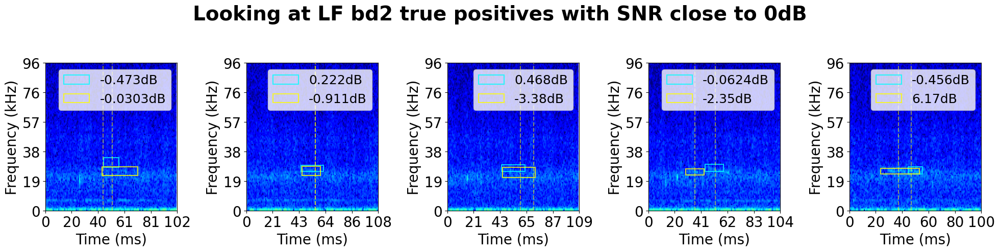

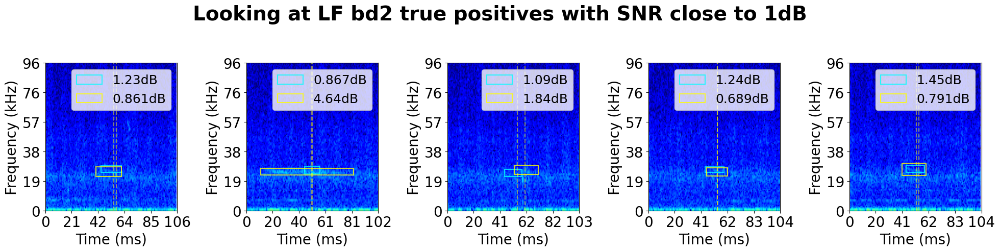

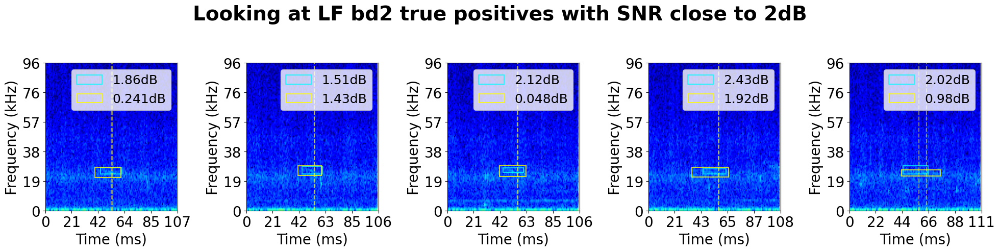

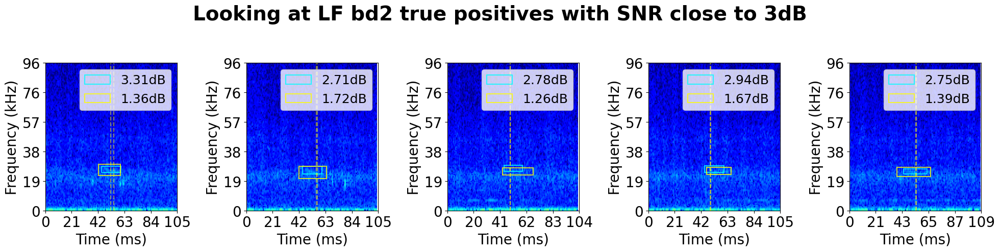

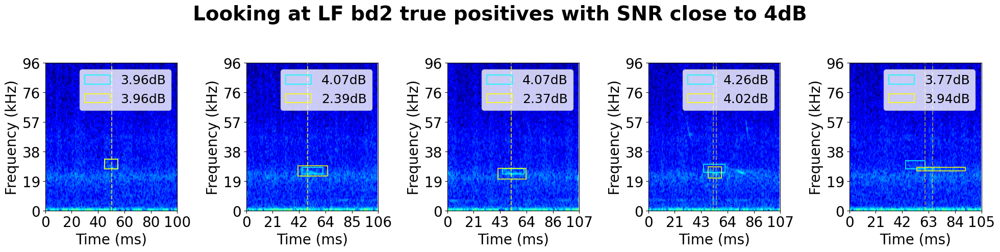

...

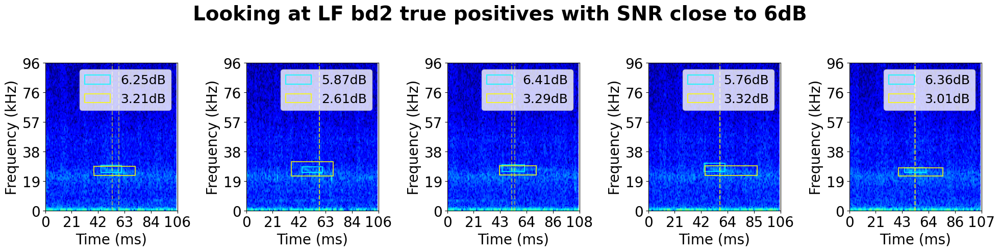

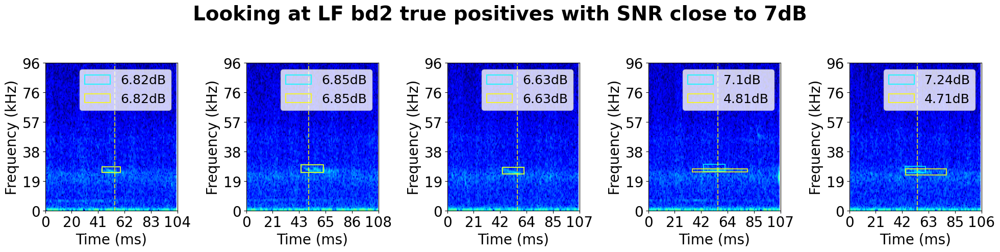

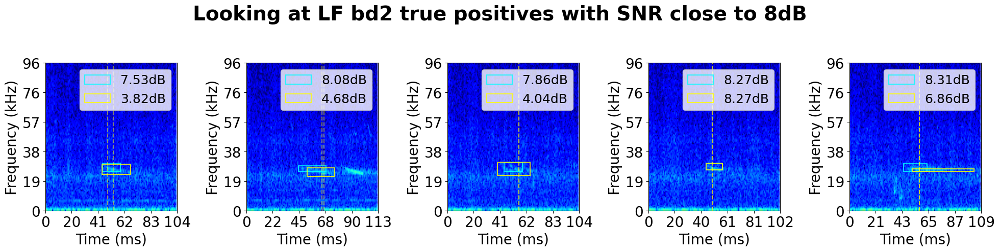

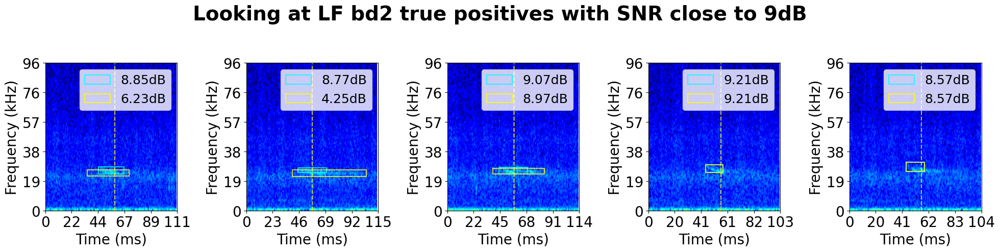

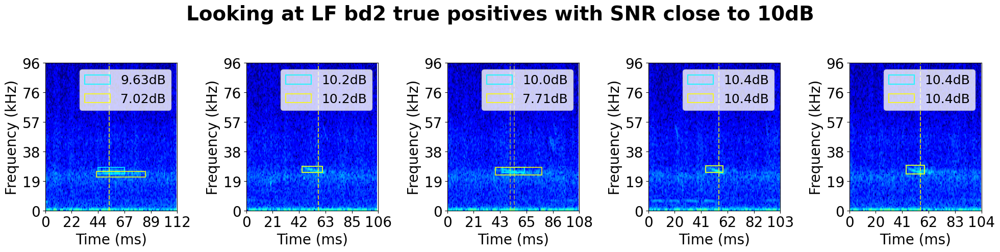

In [47]:
for snr_threshold in np.arange(0, 11, 1):
    snrbased_selections = lf_bd2_true_positives[np.isclose(lf_bd2_true_positives['SNR'], snr_threshold, atol=0.5)].sample(n=5).reset_index(drop=True).copy()
    plt.figure(figsize=(4*5, 5))
    plt.rcParams.update({'font.size': 20})
    plt.suptitle(f'Looking at LF bd2 true positives with SNR close to {snr_threshold}dB', y=1.01, fontsize=28, fontweight='bold')
    for i, sel_ind in enumerate((snrbased_selections.index).values):
        plt.subplot(1,5,i+1)
        selection_row = snrbased_selections.iloc[sel_ind]
        file_name = f'{wav_filename}.WAV'
        file_path = Path(raventxt_human_files_dir) / file_name
        audio_file = sf.SoundFile(file_path)
        fs = audio_file.samplerate

        start = selection_row['start_time']-0.045
        audio_file.seek(int(fs*(start)))
        duration = (selection_row['end_time']-selection_row['start_time'])+0.09
        audio_seg = audio_file.read(int(fs*duration))

        plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)

        ax = plt.gca()
        rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                        (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                        linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8, label=f'{selection_row["SNR"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color='yellow', alpha=0.5)

        lf_human_dets_in_window = bd2_human_df_file_LF[(bd2_human_df_file_LF['start_time']>=start)&(bd2_human_df_file_LF['end_time']<=(start+duration))]
        if len(lf_human_dets_in_window)>0:
            single_lf_human_det = lf_human_dets_in_window.iloc[0]
            rect = patches.Rectangle(((single_lf_human_det['start_time'] - start), single_lf_human_det['low_freq']), 
                            (single_lf_human_det['end_time'] - single_lf_human_det['start_time']), (single_lf_human_det['high_freq'] - single_lf_human_det['low_freq']), 
                            linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{single_lf_human_det["adityas_method_snr_dB"]:.3}dB')
            ax.add_patch(rect)
            ax.axvline(x=single_lf_human_det['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)
        plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
        plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
        plt.ylabel("Frequency (kHz)")
        plt.xlabel("Time (ms)")
        plt.legend(fontsize=18)

    plt.tight_layout()
    plt.show()

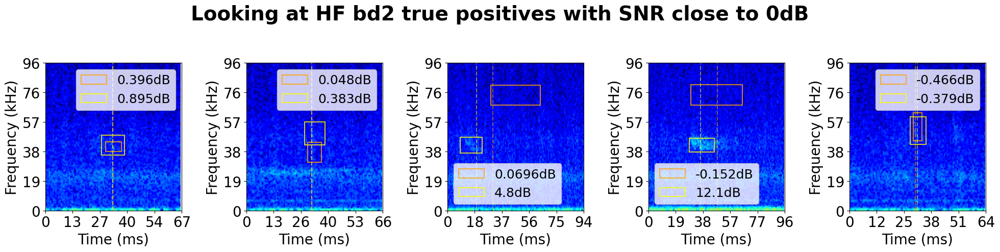

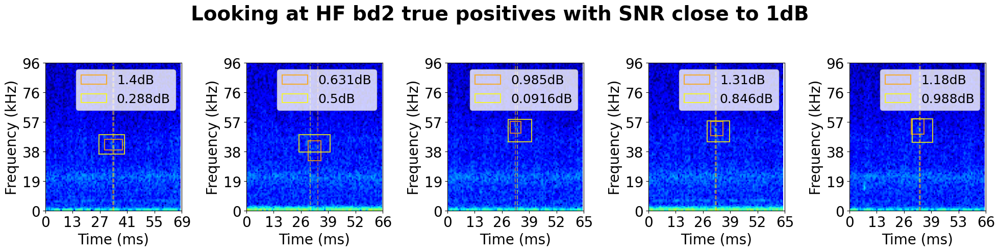

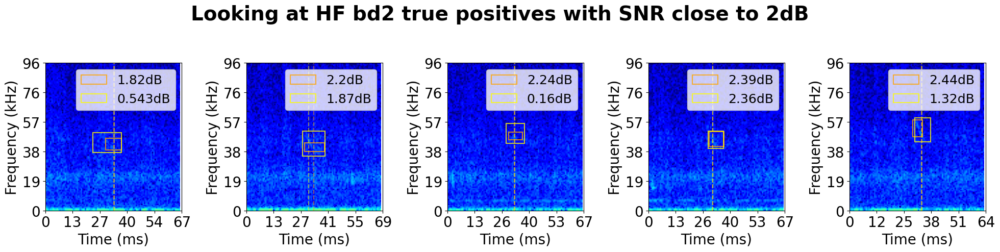

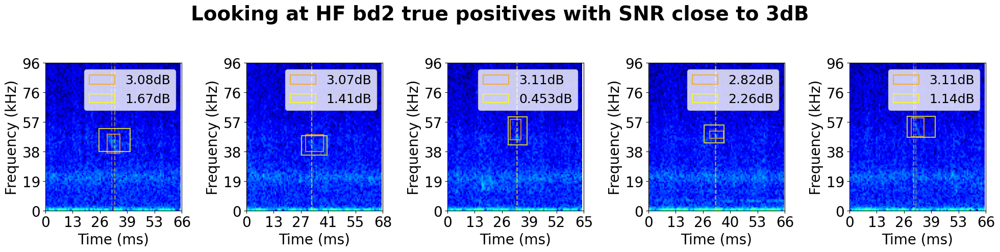

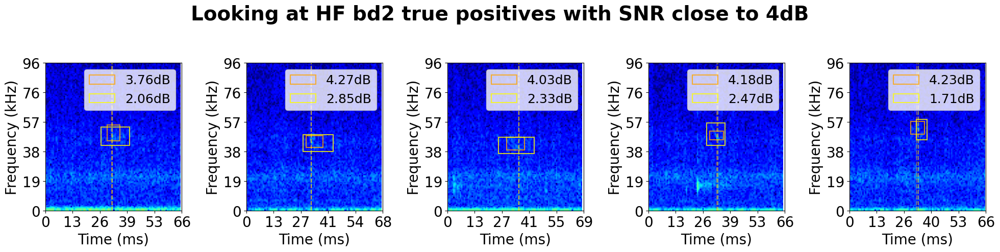

...

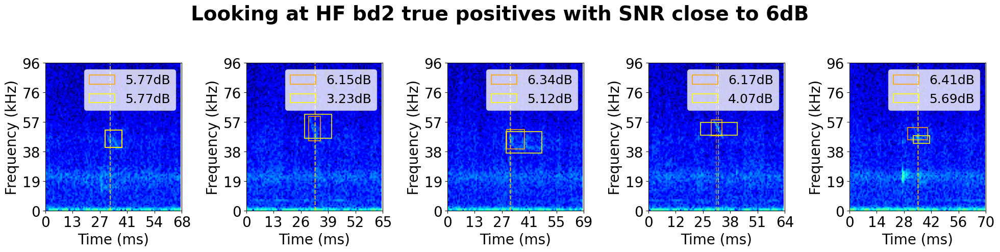

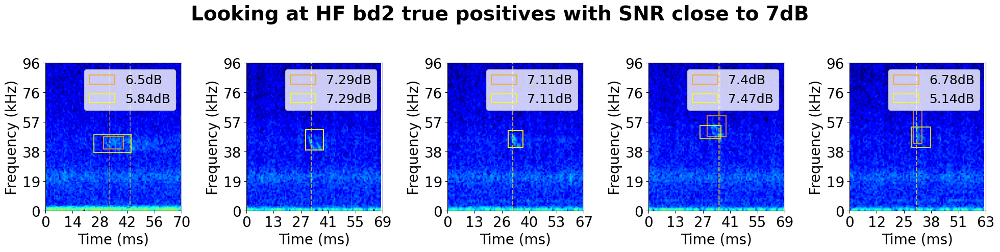

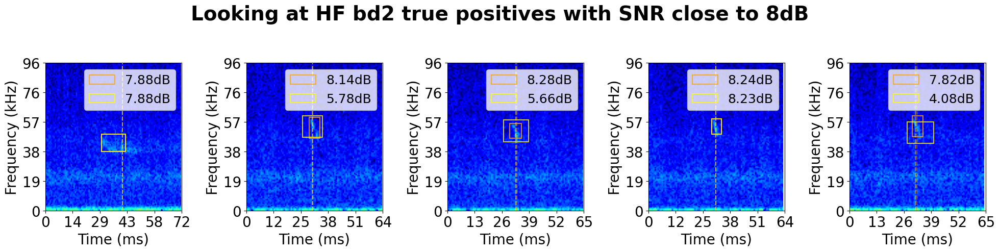

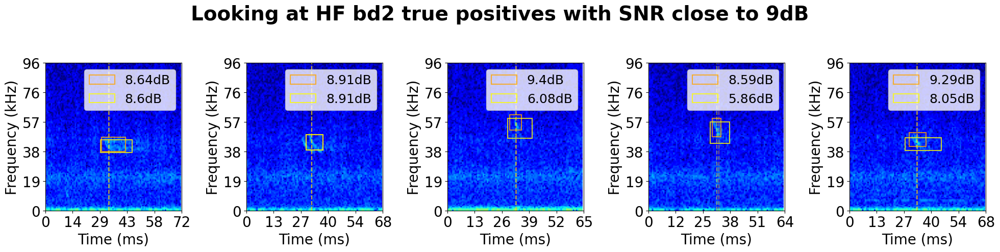

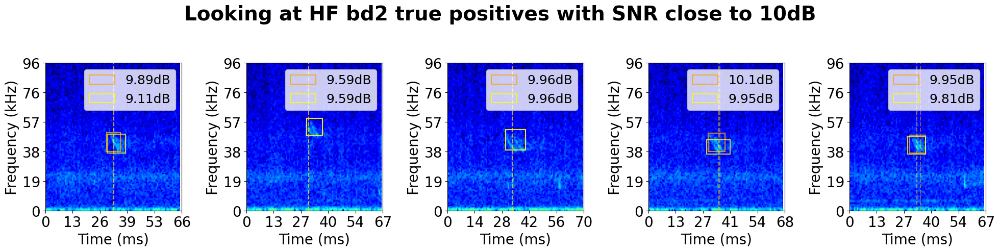

In [44]:
for snr_threshold in np.arange(0, 11, 1):
    snrbased_selections = hf_bd2_true_positives[np.isclose(hf_bd2_true_positives['SNR'], snr_threshold, atol=0.5)].sample(n=5).reset_index(drop=True).copy()
    plt.figure(figsize=(4*5, 5))
    plt.rcParams.update({'font.size': 20})
    plt.suptitle(f'Looking at HF bd2 true positives with SNR close to {snr_threshold}dB', y=1.01, fontsize=28, fontweight='bold')
    for i, sel_ind in enumerate((snrbased_selections.index).values):
        plt.subplot(1,5,i+1)
        selection_row = snrbased_selections.iloc[sel_ind]
        file_name = f'{wav_filename}.WAV'
        file_path = Path(raventxt_human_files_dir) / file_name
        audio_file = sf.SoundFile(file_path)
        fs = audio_file.samplerate

        start = selection_row['start_time']-0.03
        audio_file.seek(int(fs*(start)))
        duration = (selection_row['end_time']-selection_row['start_time'])+0.06
        audio_seg = audio_file.read(int(fs*duration))
        plt.specgram(audio_seg, NFFT=256, Fs=fs, cmap='jet', vmin=-120, vmax=0)
        ax = plt.gca()
        rect = patches.Rectangle(((selection_row['start_time'] - start), selection_row['low_freq']), 
                        (selection_row['end_time'] - selection_row['start_time']), (selection_row['high_freq'] - selection_row['low_freq']), 
                        linewidth=1.5, edgecolor=FREQ_COLORS[selection_row['freq_group']], facecolor='none', alpha=0.8, label=f'{selection_row["SNR"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=selection_row['peak_frequency_time_SPECTROGRAM']-start, linestyle='dashed', color=FREQ_COLORS[selection_row['freq_group']], alpha=0.5)

        hf_human_dets_in_window = bd2_human_df_file_HF[(bd2_human_df_file_HF['start_time']>=start)&(bd2_human_df_file_HF['end_time']<=(start+duration))]
        single_hf_human_det = hf_human_dets_in_window.iloc[0]
        rect = patches.Rectangle(((single_hf_human_det['start_time'] - start), single_hf_human_det['low_freq']), 
                        (single_hf_human_det['end_time'] - single_hf_human_det['start_time']), (single_hf_human_det['high_freq'] - single_hf_human_det['low_freq']), 
                        linewidth=1.5, edgecolor='yellow', facecolor='none', alpha=0.8, label=f'{single_hf_human_det["adityas_method_snr_dB"]:.3}dB')
        ax.add_patch(rect)
        ax.axvline(x=single_hf_human_det['peak_frequency_time']-start, linestyle='dashed', color='yellow', alpha=0.5)

        plt.xticks(ticks=np.linspace(0, duration, 6),labels=(1000*np.linspace(0, duration, 6)).astype(int))
        plt.yticks(ticks=np.linspace(0, fs/2, 6), labels=np.linspace(0, fs/2000, 6).astype('int'))
        plt.ylabel("Frequency (kHz)")
        plt.xlabel("Time (ms)")
        plt.legend(fontsize=18)

    plt.tight_layout()
    plt.show()